In [36]:
import pandas as pd
import numpy as np
import collections
import geopandas as gpd
import folium
import matplotlib.pyplot as plt

from branca.colormap import linear

In [37]:
# data paths
countries_shp = "/Users/oliverpaul/Data_Science/content_engine/map_gavi/world_countries/World_Countries__Generalized_.shp"
vax_data = "/Users/oliverpaul/Data_Science/content_engine/map_gavi/vax_data.csv"
kosovo = "/Users/oliverpaul/Data_Science/content_engine/map_gavi/kosovo/gadm36_XKO_0.shp"
serbia = "/Users/oliverpaul/Data_Science/content_engine/map_gavi/serbia/gadm36_SRB_0.shp"

## Loading geographic data and transforming projections

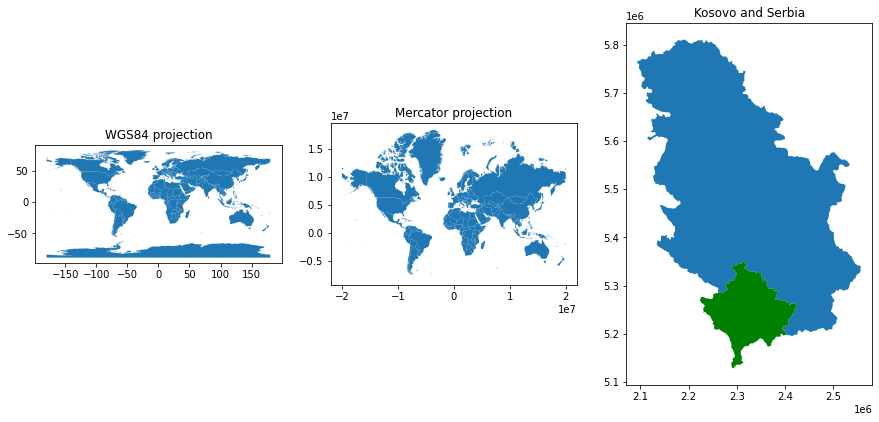

In [38]:
# loading shapefile
countries_wgs84 = gpd.read_file(countries_shp)

# annoyingly the esri dataset still hasnt updates Kosovo as an 
# independent country, so we import them as seperate files and
# merge
kosovo = gpd.read_file(kosovo)
serbia = gpd.read_file(serbia)

# converting to MERCATOR projection
# need to remove Antartica
countries = countries_wgs84[(countries_wgs84['COUNTRY'] != 'Antarctica') &
                            (countries_wgs84['COUNTRY'] != 'French Southern and Antarctic Lands') & 
                            (countries_wgs84['COUNTRY'] != 'Serbia')]

countries = countries[['COUNTRY', 'COUNTRYAFF', 'geometry']].copy()
kosovo = kosovo[['NAME_0', 'GID_0', 'geometry']].rename(
    columns={"NAME_0": "COUNTRY", "GID_0": "COUNTRYAFF"})
serbia = serbia[['NAME_0', 'GID_0', 'geometry']].rename(
    columns={"NAME_0": "COUNTRY", "GID_0": "COUNTRYAFF"})

# concat the frames
countries = pd.concat([countries, kosovo, serbia], axis=0).reset_index(drop=True)

countries = countries.to_crs('epsg:3857')

# plotting to check projection transformation worked
fig, ax = plt.subplots(1, 3, figsize=(15,10))
countries_wgs84.plot(ax=ax[0])
countries.plot(ax=ax[1])
countries[countries.COUNTRY=='Serbia'].plot(ax=ax[2])
countries[countries.COUNTRY=='Kosovo'].plot(ax=ax[2], facecolor='g')
ax[0].set_title("WGS84 projection")
ax[1].set_title("Mercator projection")
ax[2].set_title("Kosovo and Serbia")
plt.show()

## Loading Vaccine data

In [39]:
df = pd.read_csv("vax_data.csv")
df = df.drop(['Unnamed: 4', 'Unnamed: 6'], axis=1)

In [40]:
numeric_cols = ['Doses – AZ/SII (indicative distribution)',
               'Doses – AZ/SKBio (indicative distribution)',
               'Doses – Pfizer-BioNTech (exceptional allocation)']

# removing leading or trailing whitespaces
df = df.apply(lambda x: x.str.strip() if x.dtype == "object" else x)

# stripping commas and other unwanted punctuation then converting,
# to numeric 
for col in numeric_cols:
    df[col] = df[col].str.replace(',', '')
    df[col] = df[col].str.replace('-', '0')
    df[col] = pd.to_numeric(df[col])
    
# some of the column names have trailing whitespaces.
# removing them 
names = []
for col in list(df.columns):
    names.append(col.strip())
df.columns = names
df = df.rename(columns={"Participant": "COUNTRY"})

### Geocoding the vaccine data

In [41]:
# converting columns of interest into python sets
set_countries, set_vax = set(countries.COUNTRY), set(df.COUNTRY)
#print([item for item, count in collections.Counter(list(countries.COUNTRY)).items() if count > 1])
print(set_vax - set_countries)

{'Syrian Arab Republic**', 'Egypt, Arab Rep.', 'St. Vincent and the Grenadines', 'Lao PDR', 'Korea, Dem. People’s Rep.', 'St. Lucia', 'Micronesia, Fed. Sts.', 'West Bank and Gaza', 'St. Kitts and Nevis', 'Gambia, The', 'Congo, Rep.', 'Yemen, Rep.', 'Kyrgyz Republic', 'Republic of Korea', 'Congo, Dem. Rep.', "Cote d'Ivoire"}


In [42]:
def clean_names(txt):
    txt = txt.replace('Congo, Dem. Rep.', 'Congo DRC')
    txt = txt.replace('Congo, Rep.', 'Congo')
    txt = txt.replace("Cote d'Ivoire", "Côte d'Ivoire")
    txt = txt.replace('Gambia, The', 'Gambia')
    txt = txt.replace('Korea, Dem. People’s Rep.', 'North Korea')
    txt = txt.replace('Kyrgyz Republic', 'Kyrgyzstan')
    txt = txt.replace('Lao PDR', 'Laos')
    txt = txt.replace('Micronesia, Fed. Sts.', 'Micronesia')
    txt = txt.replace('Republic of Korea', 'South Korea')
    txt = txt.replace('St. Kitts and Nevis', 'Saint Kitts and Nevis')
    txt = txt.replace('St. Lucia', 'Saint Lucia')
    txt = txt.replace('St. Vincent and the Grenadines', 'Saint Vincent and the Grenadines')
    txt = txt.replace('Syrian Arab Republic**', 'Syria')
    txt = txt.replace('West Bank and Gaza', 'Palestinian Territory')
    txt = txt.replace('Yemen, Rep.', 'Yemen')
    txt = txt.replace('Egypt, Arab Rep.', 'Egypt')
    return txt

df['COUNTRY'] = df['COUNTRY'].apply(clean_names)
set_vax = set(df.COUNTRY)
print(set_vax - set_countries)

set()


In [66]:
# merging vax data to geospatial data
df_map = countries.merge(df, how='inner', on='COUNTRY')

df_map['total'] = df_map[['Doses – AZ/SII (indicative distribution)', 
                          'Doses – AZ/SKBio (indicative distribution)', 
                          'Doses – Pfizer-BioNTech (exceptional allocation)']].sum(axis=1)
df_map['total_mil'] = df_map['total'] * 0.000001

## Mapping the data

In [142]:
map_ = folium.Map(location=[35,0], zoom_start=1,
                  tiles=None, crs='EPSG3857', 
                  control_scale=True, attributionControl=False, 
                  min_zoom=2, min_lot=-55,
                  max_lot=-179, min_lat=-60, 
                  max_lat=179, max_bounds=True)

folium.TileLayer('CartoDB positron',name="Light Map",
                 control=False, max_zoom=6, min_zoom=2).add_to(map_)

custom_scale = (df_map['total_mil'].quantile((0,0.8,0.95,0.99, 1))).tolist()
folium.Choropleth(
    geo_data=df_map,
    name='Choropleth',
    data=df_map,
    columns=['COUNTRY','total_mil'],
    key_on="feature.properties.COUNTRY",
    fill_color='YlGnBu',
    threshold_scale=custom_scale,
    fill_opacity=0.5,
    line_opacity=0.2,
    legend_name='Number of doses. Millions.',
    smooth_factor=0
).add_to(map_)

style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
FEATURES = folium.features.GeoJson(
    df_map,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['COUNTRY',
                'Doses – AZ/SII (indicative distribution)', 
                'Doses – AZ/SKBio (indicative distribution)', 
                'Doses – Pfizer-BioNTech (exceptional allocation)'],
        aliases=['Participant: ',
                 'Doses – AZ/SII (indicative distribution): ',
                 'Doses – AZ/SKBio (indicative distribution): ',
                 'Doses – Pfizer-BioNTech (exceptional allocation): '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
map_.add_child(FEATURES)
map_.keep_in_front(FEATURES)
map_